[공지사항]
* 제작 과정에서 강의명이 변경되어 영상 및 강의 자료에 표기된 강의명은 촬영 시점에 사용된 것으로, 강의 내용에는 변동이 없음을 안내드리오며 수강에 혼선 없으시길 바랍니다.

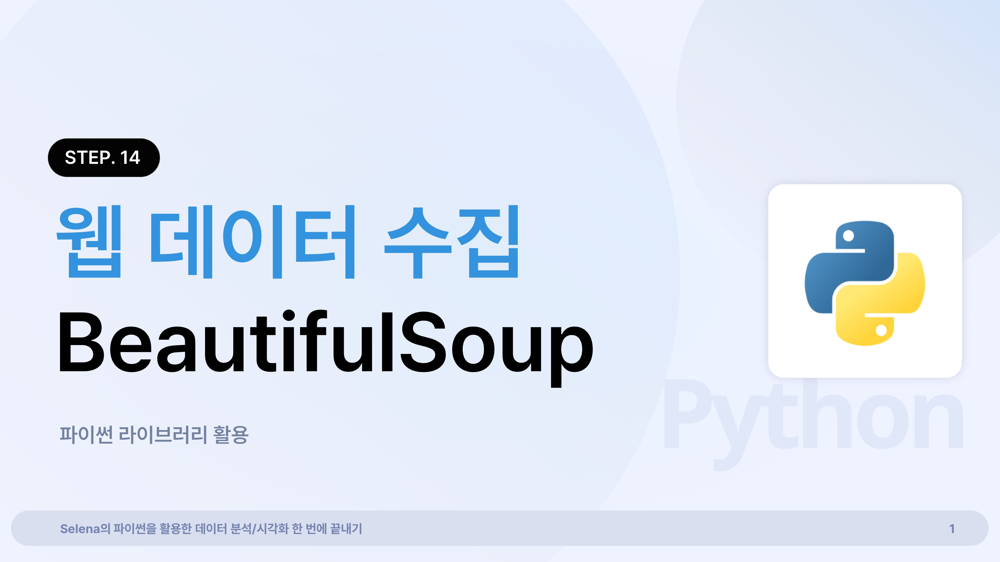

# **STEP 14. 웹 데이터 수집**

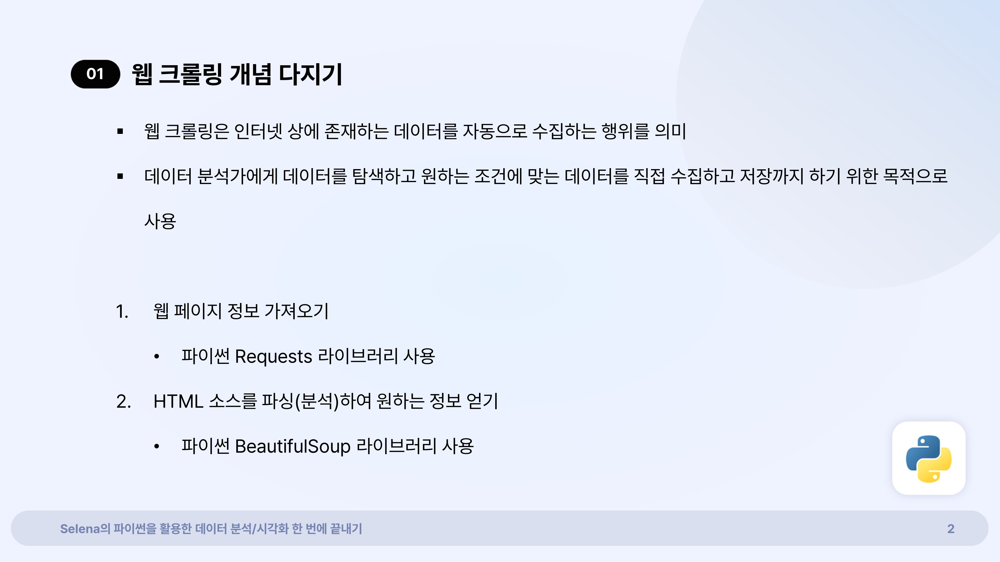

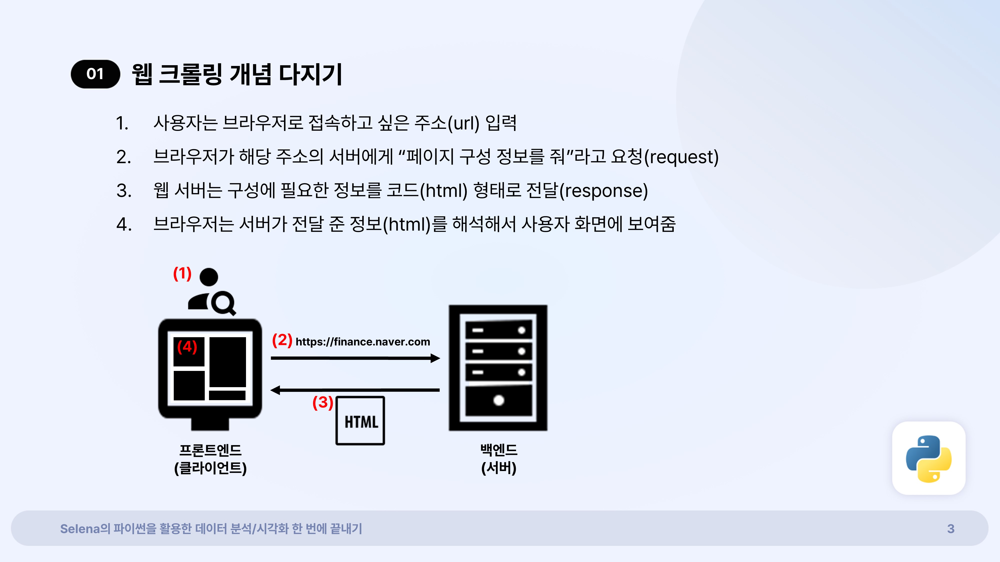

## **1. 웹 크롤링 개념 다지기**

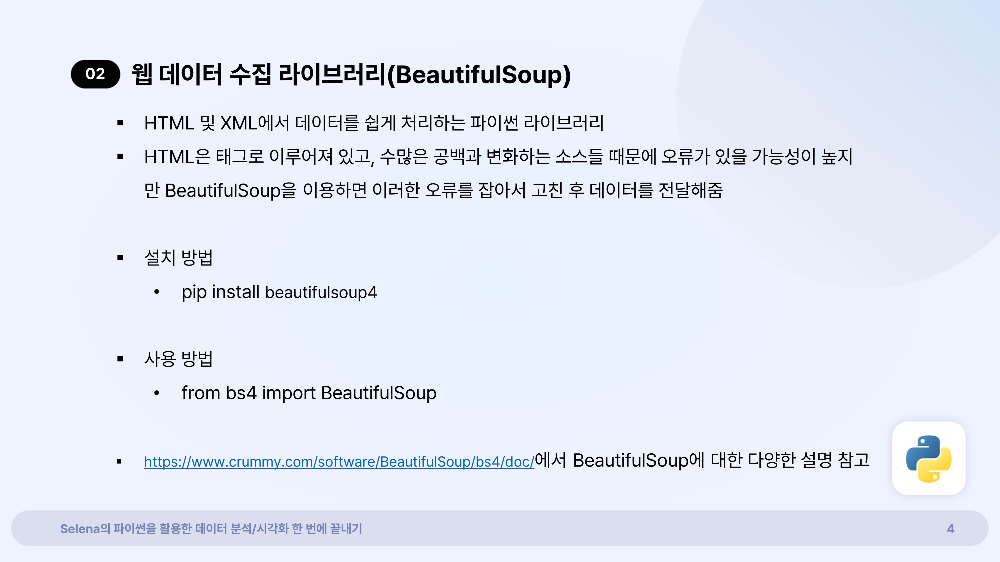

## **2. BeautifulSoup 기본 개념**

*   BeautifulSoup 패키지 추가
*   패키지가 없는 경우, 설치 명령어 : pip install beautifulsoup4

In [1]:
# BeautifulSoup 불러오기
from bs4 import BeautifulSoup

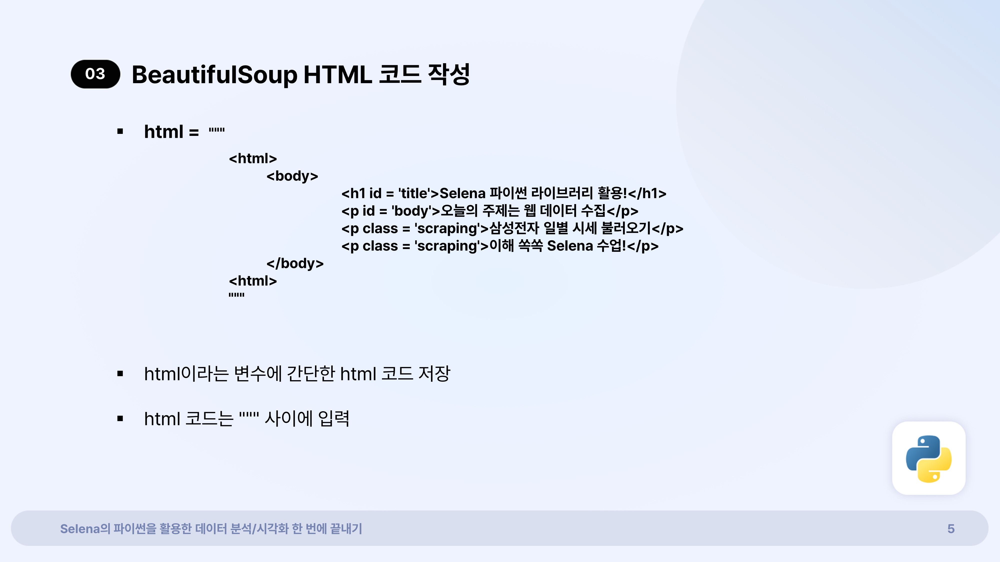

## **3. BeautifulSoup HTML 코드 작성**
- html이라는 변수에 간단한 html 코드 저장
- html 코드는 """ 사이에 입력


In [2]:
# HTML 코드 작성
html =  """
<html>
	<body>
	<h1 id = 'title'>Selena 파이썬 라이브러리 활용!</h1>
	<p id = 'body'>오늘의 주제는 웹 데이터 수집</p>
	<p class = 'scraping'>삼성전자 일별 시세 불러오기</p>
	<p class = 'scraping'>이해 쏙쏙 Selena 수업!</p>
	</body>
<html>
"""

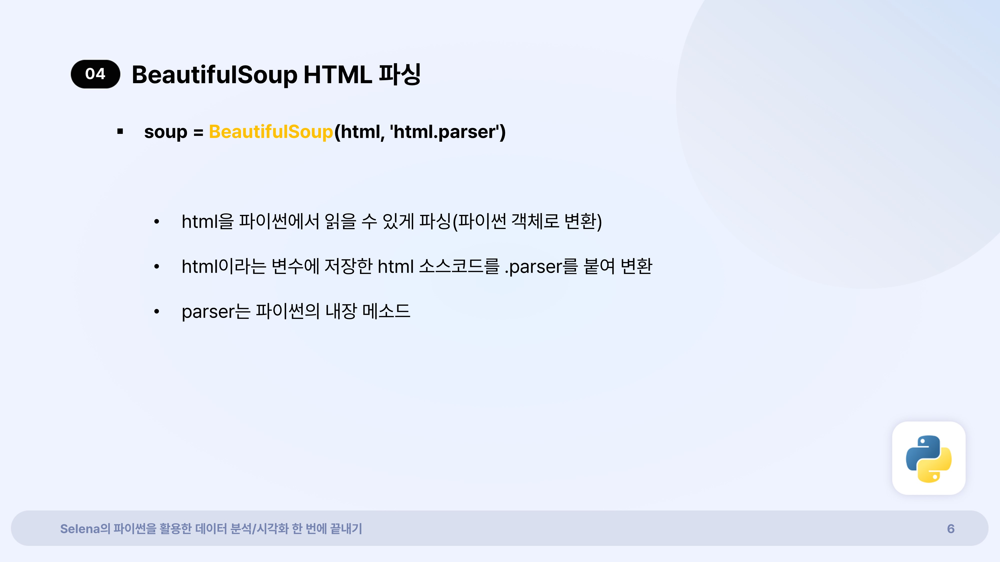

## **4. BeautifulSoup HTML 파싱**
- html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
- html이라는 변수에 저장한 html 소스코드를 .parser를 붙여 변환

In [3]:
# BeautifulSoup 함수를 이용하여 soup 객체 생성
# html이라는 변수에 저장한 html 소스코드를 .parser를 붙여 변환
soup = BeautifulSoup(html, 'html.parser')

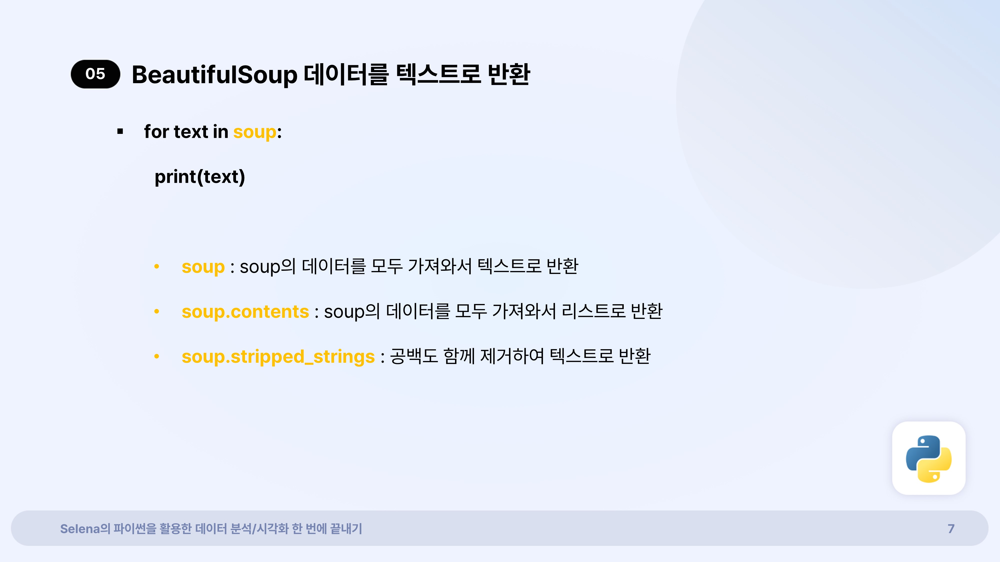

## **5. BeautifulSoup 데이터를 텍스트로 반환**

### **5-1. soup**
- soup : soup의 데이터를 모두 가져와서 텍스트로 반환
- soup.contents : soup의 데이터를 모두 가져와서 리스트로 반환

In [4]:
# soup의 데이터를 모두 가져와서 텍스트로 반환
for text in soup:
  print(text)



<html>
<body>
<h1 id="title">Selena 파이썬 라이브러리 활용!</h1>
<p id="body">오늘의 주제는 웹 데이터 수집</p>
<p class="scraping">삼성전자 일별 시세 불러오기</p>
<p class="scraping">이해 쏙쏙 Selena 수업!</p>
</body>
<html>
</html></html>


### **5-2. soup.stripped_strings**
- soup.stripped_strings : 공백도 함께 제거하여 텍스트로 반환

In [5]:
# soup의 데이터를 모두 가져와서
# 공백도 함께 제거하여 텍스트로 반환
for stripped_text in soup.stripped_strings:
  print(stripped_text)

Selena 파이썬 라이브러리 활용!
오늘의 주제는 웹 데이터 수집
삼성전자 일별 시세 불러오기
이해 쏙쏙 Selena 수업!


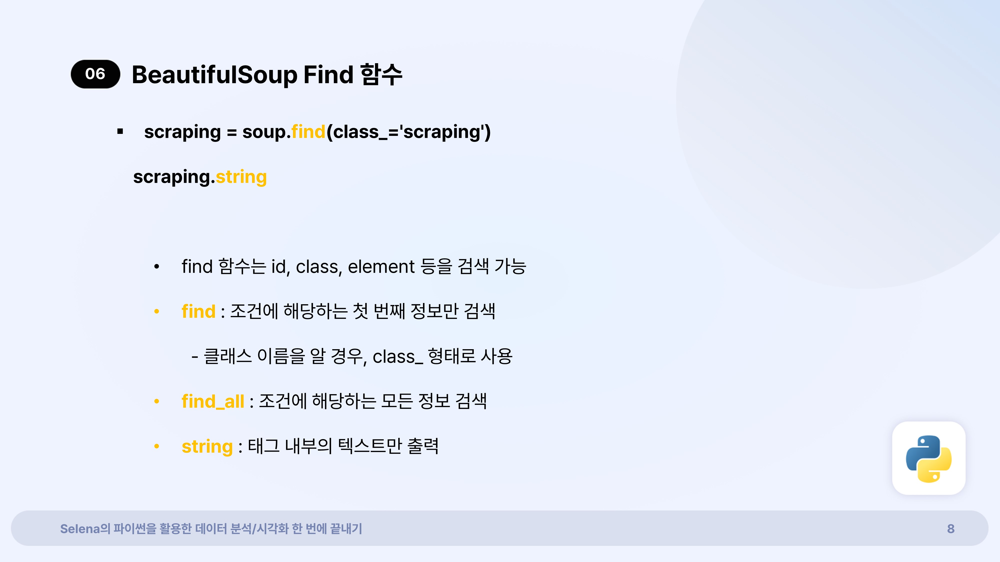

## **6. BeautifulSoup Find 함수**

 ### **6-1. find()**
- find 함수는 id, class, element 등을 검색 가능
- find : 조건에 해당하는 첫 번째 정보만 검색
> - 클래스 이름을 알 경우, class_ 형태로 사용

In [6]:
# id 값이 'title'인 조건에 해당하는 첫 번째 정보만 검색
title = soup.find(id='title')
print(title)

<h1 id="title">Selena 파이썬 라이브러리 활용!</h1>


In [7]:
# class 값이 'scraping'인 조건에 해당하는 첫 번째 정보만 검색
# 클래스 이름을 알 경우, class_ 형태로 사용
scraping = soup.find(class_='scraping')
print(scraping)

<p class="scraping">삼성전자 일별 시세 불러오기</p>


### **6-2. find_all()**
 - find_all : 조건에 해당하는 모든 정보 검색

In [8]:
# class 값이 'scraping'인 조건에 해당하는 모든 정보 검색
scraping_all = soup.find_all(class_='scraping')
print(scraping_all)

[<p class="scraping">삼성전자 일별 시세 불러오기</p>, <p class="scraping">이해 쏙쏙 Selena 수업!</p>]


### **6-3. string**
- string : 태그 내부의 텍스트만 출력



In [9]:
# 태그 내부의 텍스트만 출력
scraping.string

'삼성전자 일별 시세 불러오기'

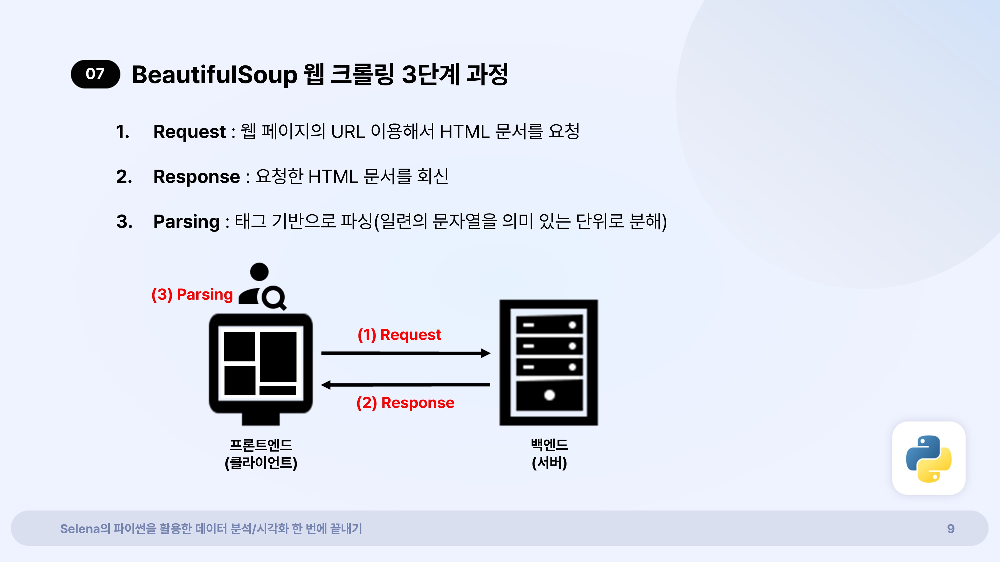

## **7. BeautifulSoup 웹 크롤링 3단계 과정**
- Request : 웹 페이지의 URL 이용해서 HTML 문서를 요청
> - 첫 번째 단계인 Request를 위해 import urllib.request 불러오기
- Response : 요청한 HTML 문서를 회신
- Parsing : 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)


In [10]:
# 웹 페이지의 URL을 이용해서 HTML 문서를 요청하기 위해 필요한 라이브러리
import requests

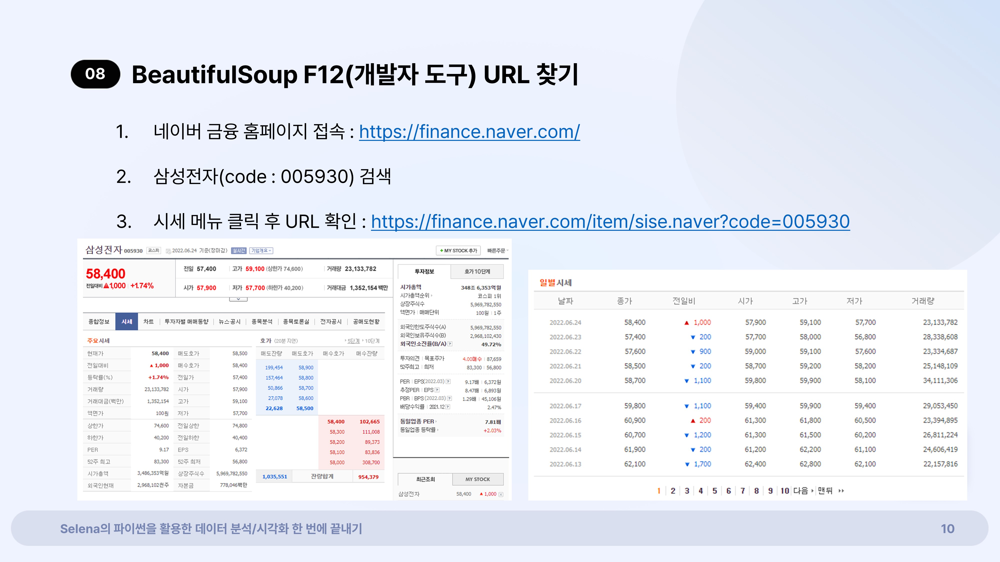

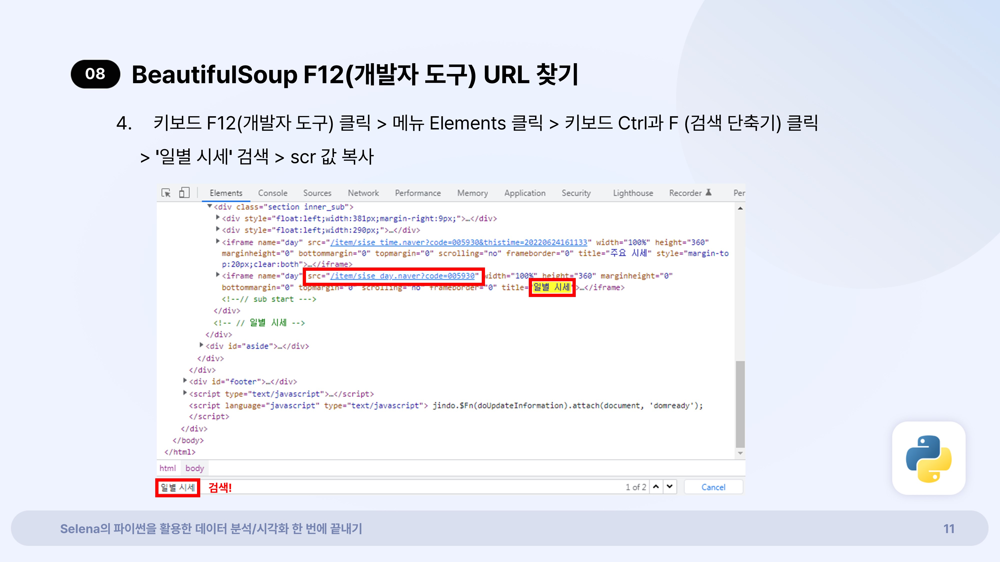

## **8. BeautifulSoup F12(개발자 도구) URL 찾기**
- 1) 네이버 금융 홈페이지 접속 : https://finance.naver.com/
- 2) 삼성전자(code : 005930) 검색
- 3) 시세 메뉴 클릭 후 URL 확인 : https://finance.naver.com/item/sise.naver?code=005930
- 4) 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '일별 시세' 검색 > scr 값 복사  


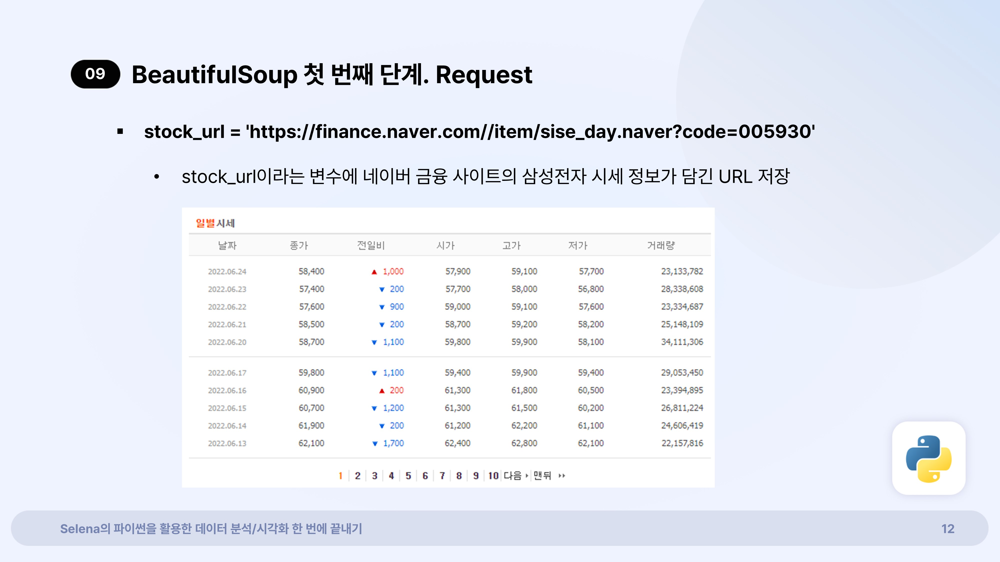

## **9. BeautifulSoup 첫 번째 단계. Request**

### **9-1. URL 저장**
- stock_url이라는 변수에 네이버 금융 사이트의 삼성전자 시세 정보가 담긴 URL 저장

In [11]:
# stock_url이라는 변수에 URL 저장
stock_url = 'https://finance.naver.com//item/sise_day.naver?code=005930'

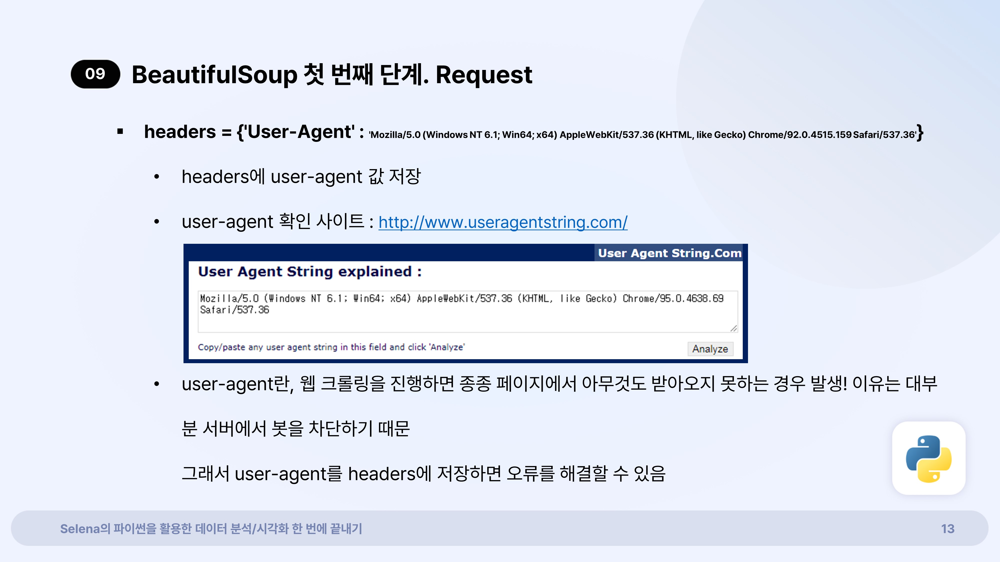

### **9-2. User-agent 설정**
- user-agent 확인 사이트 : http://www.useragentstring.com/
- user-agent란, 웹 크롤링을 진행하면 종종 페이지에서 아무것도 받아오지 못하는 경우 발생! 이유는 대부분 서버에서 봇을 차단하기 때문
- 그래서 user-agent를 headers에 저장하면 오류를 해결할 수 있음


In [12]:
# header에 user-agent 값 저장
headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}

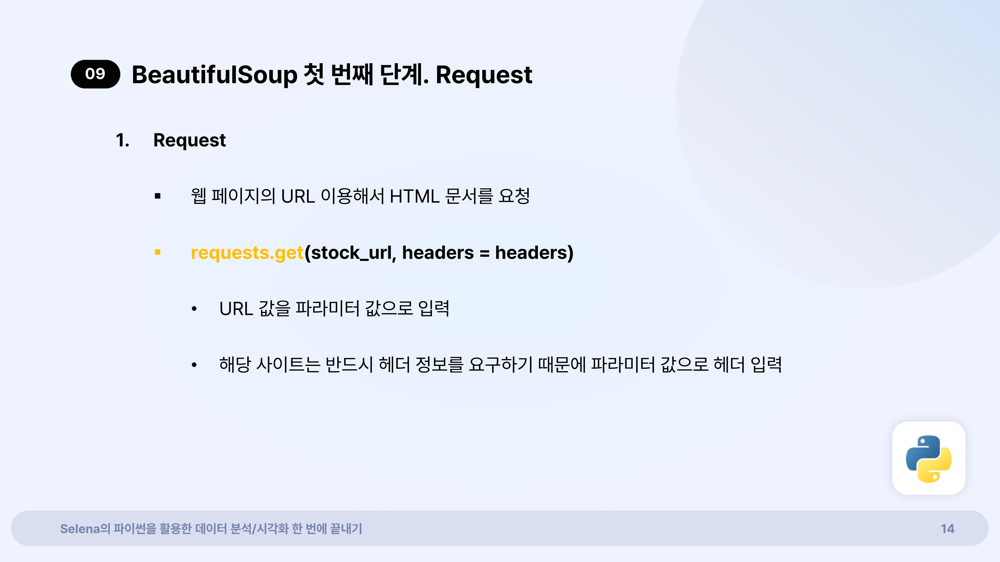

### **9-3. requests.get()**
- 웹 페이지의 URL 이용해서 HTML 문서를 요청
- requests.get(stock_url, headers = headers)
> - URL 값을 파라미터 값으로 입력
> - 해당 사이트는 반드시 헤더 정보를 요구하기 때문에 파라미터 값으로 헤더 입력

In [13]:
# request.get 함수를 통해 URL를 이용하여 HTML 문서를 요청
requests.get(stock_url, headers = headers)

<Response [200]>

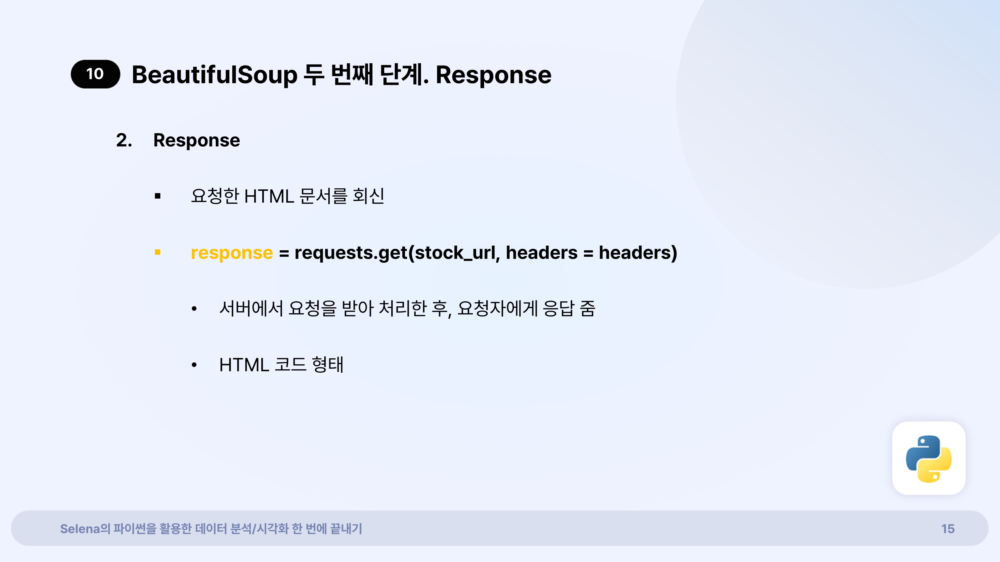

## **10. BeautifulSoup 두 번째 단계. Response**
- 요청한 HTML 문서를 회신
- response = requests.get(stock_url, headers = headers)
> - 서버에서 요청을 받아 처리한 후, 요청자에게 응답 줌
> - HTML 코드 형태

In [14]:
# response 변수에 요청한 HTML 문서를 회신하여 저장
response = requests.get(stock_url, headers = headers)

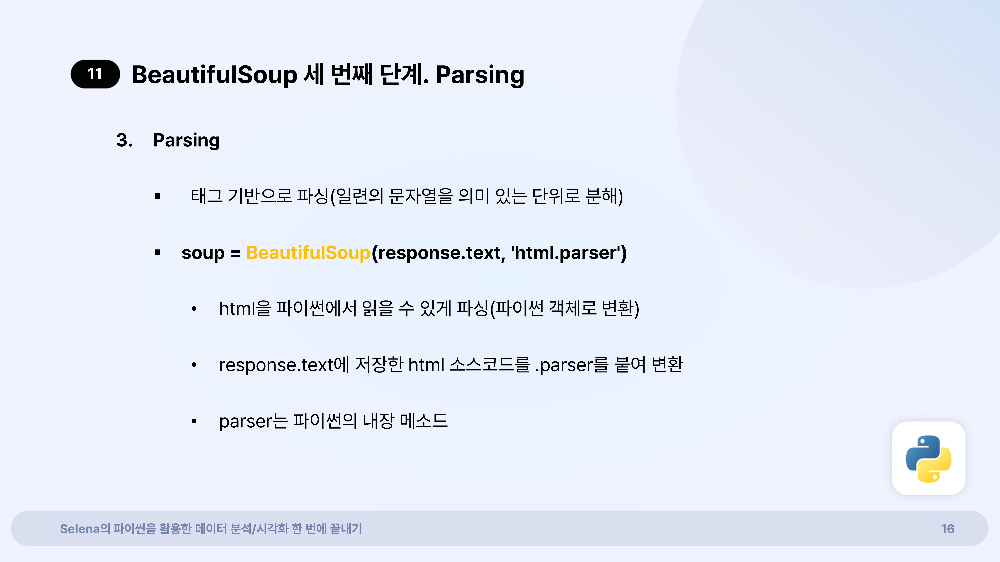

## **11. BeautifulSoup 세 번째 단계. Parsing**
- 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)
- soup = BeautifulSoup(response.text, 'html.parser')
> - html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
> - Response.text에 저장한 html 소스코드를 .parser를 붙여 변환
> - parser는 파이썬의 내장 메소드


In [15]:
# soup 변수에 BeautifulSoup의 객체 생성
# HTML 코드를 파이썬에서 읽을 수 있도록 파싱
soup = BeautifulSoup(response.text, 'html.parser')

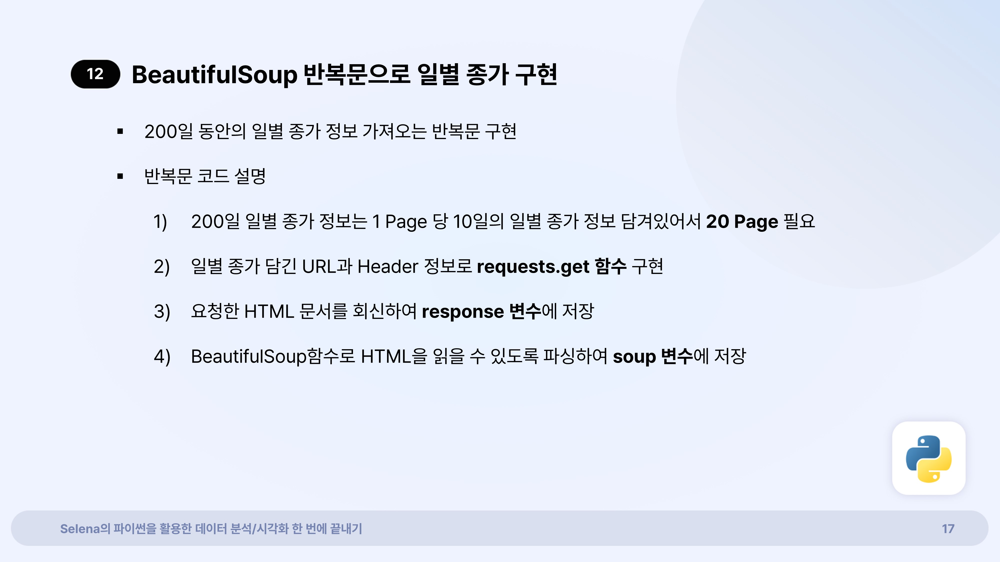

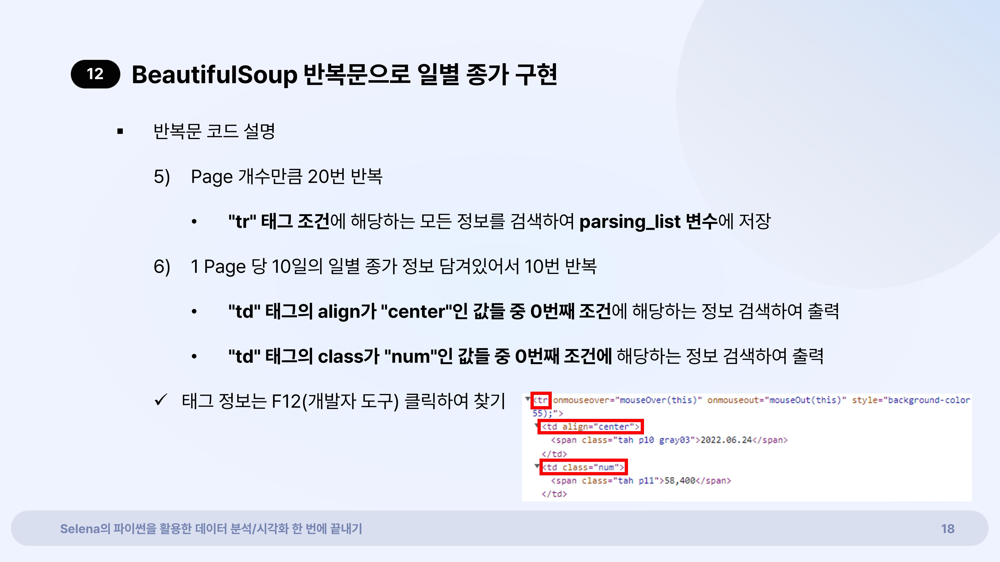

## **12. BeautifulSoup 반복문으로 일별 종가 구현**
- 1) 200일 일별 종가 정보는 1 Page 당 10일의 일별 종가 정보 담겨있어서 20 Page 필요
- 2) 일별 종가 담긴 URL과 Header 정보로 requests.get 함수 구현
- 3) 요청한 HTML 문서를 회신하여 response 변수에 저장
- 4) BeautifulSoup함수로 HTML을 읽을 수 있도록 파싱하여 soup 변수에 저장
- 5) Page 개수만큼 20번 반복
> - "tr" 태그 조건에 해당하는 모든 정보를 검색하여 parsing_list 변수에 저장
- 6) 1 Page 당 10일의 일별 종가 정보 담겨있어서 10번 반복
> - "td" 태그의 align가 "center"인 값들 중 0번째 조건에 해당하는 정보 검색하여 출력
> - "td" 태그의 class가 "num"인 값들 중 0번째 조건에 해당하는 정보 검색하여 출력

**태그 정보는 F12(개발자 도구) 클릭하여 찾기**

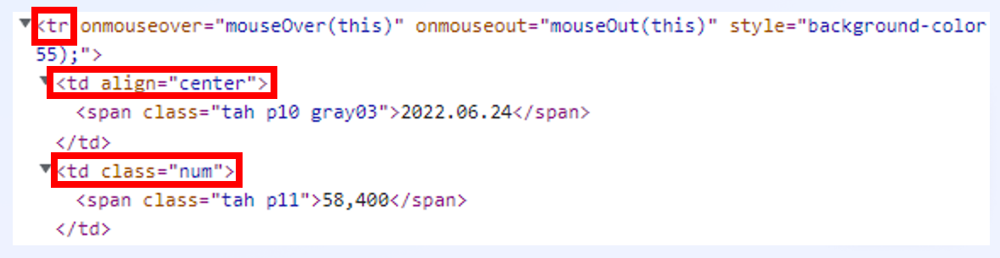

In [16]:
# 200일 동안의 일별 종가 정보 가져오는 반복문(1페이지 당 10일 정보 담겨있음)
for page in range(1, 21):
  print (str(page))

  # url + page 번호 합치기
  stock_url = 'http://finance.naver.com/item/sise_day.nhn?code=005930' +'&page='+ str(page)

  # header 정보
  headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}

  # request : 웹 페이지의 URL, header 이용해서 HTML 문서 요청
  # response : 요청한 HTML 문서 회신
  response = requests.get(stock_url, headers = headers)

  # parsing : HTML을 읽을 수 있도록 파싱
  # soup 변수에 BeautifulSoup의 객체 생성
  soup = BeautifulSoup(response.text, 'html.parser')

  # "tr" 태그 조건에 해당하는 모든 정보 검색
  parsing_list = soup.find_all("tr")

  # None 값은 걸러주기 위한 변수 생성
  isCheckNone = None

  # 페이지당 일별 종가 출력하기 위한 반복문 <들여쓰기 주의>
  for i in range(1, len(parsing_list)):
    # None 값은 걸러주기 위한 조건문 <들여쓰기 주의>
    # .span()는 매치된 문자열의 (시작, 끝)에 해당하는 튜플을 돌려주는 함수
    if(parsing_list[i].span != isCheckNone):
      # parsing_list[i] : i번째 parsing_list, i 번째 "tr" 태그 값
      # .find_all("td", align="center")[0].text : "td" 태그의 align가 "center"인 값들 중 0번째 값
      # .find_all("td", class_="num")[0].text : "td" 태그의 class가 "num"인 값들 중 0번째 값
      print(parsing_list[i].find_all("td", align="center")[0].text,
            parsing_list[i].find_all("td", class_="num")[0].text)

1
2025.01.02 52,800
2024.12.30 53,200
2024.12.27 53,700
2024.12.26 53,600
2024.12.24 54,400
2024.12.23 53,500
2024.12.20 53,000
2024.12.19 53,100
2024.12.18 54,900
2024.12.17 54,200
2
2024.12.16 55,600
2024.12.13 56,100
2024.12.12 55,900
2024.12.11 54,000
2024.12.10 54,000
2024.12.09 53,400
2024.12.06 54,100
2024.12.05 53,700
2024.12.04 53,100
2024.12.03 53,600
3
2024.12.02 53,600
2024.11.29 54,200
2024.11.28 55,500
2024.11.27 56,300
2024.11.26 58,300
2024.11.25 57,900
2024.11.22 56,000
2024.11.21 56,400
2024.11.20 55,300
2024.11.19 56,300
4
2024.11.18 56,700
2024.11.15 53,500
2024.11.14 49,900
2024.11.13 50,600
2024.11.12 53,000
2024.11.11 55,000
2024.11.08 57,000
2024.11.07 57,500
2024.11.06 57,300
2024.11.05 57,600
5
2024.11.04 58,700
2024.11.01 58,300
2024.10.31 59,200
2024.10.30 59,100
2024.10.29 59,600
2024.10.28 58,100
2024.10.25 55,900
2024.10.24 56,600
2024.10.23 59,100
2024.10.22 57,700
6
2024.10.21 59,000
2024.10.18 59,200
2024.10.17 59,700
2024.10.16 59,500
2024.10.15 61,00

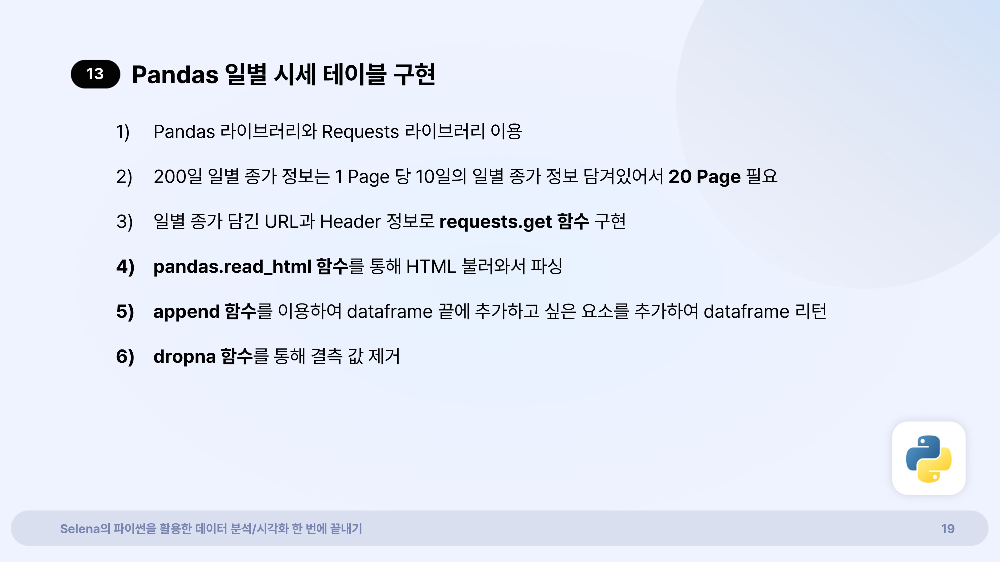

## **13. Pandas 일별 시세 테이블 구현<<코드 변경과 하단 코드 설명 참고 (2025.01.02)>>**
- 1) Pandas 라이브러리와 Requests 라이브러리 이용
- 2) StringIO를 활용한 HTML 데이터 처리
- 3) 200일 일별 종가 정보는 1 Page 당 10일의 일별 종가 정보 담겨있어서 20 Page 필요
- 4) 일별 종가 담긴 URL과 Header 정보로 requests.get 함수 구현
- 5) pandas.read_html 함수를 통해 HTML 불러와서 파싱 (StringIO로 HTML 텍스트를 파일처럼 감싸 처리)
- 6) concat 함수를 이용하여 dataframe 끝에 추가하고 싶은 요소를 추가하여 dataframe 리턴
- 7) dropna 함수를 통해 결측 값 제거


In [18]:
# 네이버 금융 일별 시세 테이블 불러오기
# pandas 라이브러리와 requests 라이브러리 이용
import pandas as pd
import requests
# StringIO는 io 모듈에 포함된 클래스이며,
# HTML 텍스트나 다른 문자열 데이터를 파일처럼 다룰 수 있도록 래핑해주는 역할
from io import StringIO


# 빈 데이터프레임을 생성하여 이후 각 페이지에서 가져온 데이터를 추가
stock_data = pd.DataFrame()

# code = 회사 코드, page = 일별 시세 테이블의 페이지 수 (200 행의 데이터 불러오려면 20 페이지 입력)
for page in range(1, 21): # ➊ 페이지 순회
   stock_url = 'http://finance.naver.com/item/sise_day.nhn?code=005930' +'&page='+ str(page)

   #  header 정보
   headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}

   # request : 웹 페이지의 URL, header 이용해서 HTML 문서 요청
   # response : 요청한 HTML 문서 회신
   response = requests.get(stock_url, headers = headers)


   # ➋ response.text로 응답을 주면 HTML 코드이기 때문에
   # 주의!! : StringIO( ) 함수를 통해 HTML 텍스트를 파일처럼 읽을 수 있도록 감싸기(설명 아래 참고)
   # pd.read_html( ) 함수를 통해 HTML 테이블을 파싱해 데이터프레임으로 변환
   df_page = pd.read_html(StringIO(response.text), header=0)[0]


   # ➌ concat() : 여러 DataFrame을 하나로 결합할 때 사용
   # 주의!! : pandas 2.0.0 버전 이후부터 'append()' Method가 완전히 제거되었기 때문에 더 이상 작동하지 않습니다. concat() 사용(설명 아래 참고)
   stock_data = pd.concat([stock_data, df_page], ignore_index=True)


# ➍ 결측값 행 제거(for문 외부에 위치하도록 들여쓰기 주의)
stock_data = stock_data.dropna()
stock_data

,날짜,종가,전일비,시가,고가,저가,거래량
1,2025.01.02,52800.0,하락 400,52700.0,53000.0,52300.0,12606759.0
2,2024.12.30,53200.0,하락 500,53300.0,54000.0,53100.0,12624702.0
3,2024.12.27,53700.0,상승 100,53500.0,54100.0,53200.0,10747196.0
4,2024.12.26,53600.0,하락 800,54500.0,54600.0,53500.0,10517075.0
5,2024.12.24,54400.0,상승 900,53700.0,54500.0,53600.0,11634677.0
...,...,...,...,...,...,...,...
294,2024.03.14,74300.0,상승 200,74400.0,74500.0,73600.0,22545539.0
295,2024.03.13,74100.0,상승 800,73700.0,74100.0,73500.0,15243134.0
296,2024.03.12,73300.0,상승 900,72600.0,73500.0,72100.0,13011654.0
297,2024.03.11,72400.0,하락 900,72900.0,73100.0,72300.0,9740504.0


In [19]:
# 13. Pandas 일별 시세 테이블 구현 ➊ ~ ➍ 코드 설명
# 추가사항 1. pandas 2.0.0 버전 이후부터 'append()' 메서드가 완전히 제거되었기 때문에 더 이상 작동하지 않습니다. concat()을 사용해야 합니다.
# 추가사항 2. `from io import StringIO`를 사용하여 HTML 문자열을 파일처럼 처리하는 기능을 추가하였습니다.

# ➊ 1부터 20까지 순회하는 for문입니다. 이 루프는 데이터를 가져올 웹 페이지 주소에 `&page=`와 숫자를 붙여
# 1페이지부터 20페이지까지의 데이터를 가져오기 위한 것입니다.

# ➋ `pd.read_html(StringIO(response.text), header=0)[0]` 코드를 세부적으로 설명하겠습니다.
# 먼저 `pd.read_html( )`은 HTML 페이지의 모든 표를 읽어서 각 표를 DataFrame 객체로 저장한 리스트를 반환합니다.
# `StringIO(response.text)`는 `from io import StringIO`로 가져온 클래스를 사용해 HTML 문자열을 파일처럼 래핑한 것입니다.
# 이를 통해 Pandas가 HTML 문자열을 파일 객체처럼 읽을 수 있도록 처리합니다.
# `header=0`은 첫 번째 행을 열 이름으로 사용한다는 의미입니다.
# 즉, 표의 첫 번째 행이 데이터프레임의 열 이름이 됩니다. `[0]`는 이 리스트에서 첫 번째 DataFrame 객체를 선택하는 것을 의미합니다.
# HTML 문서에 여러 개의 표가 있을 수 있기 때문에, 일반적으로 원하는 표를 선택하기 위해 인덱스를 사용합니다.

# ➌ 현재 stock_data 데이터프레임과 df_page 데이터프레임을 결합합니다. `ignore_index=True`는 기존 인덱스를 무시하고
# 새로운 연속적인 인덱스를 생성합니다.

# ➍ 데이터프레임에서 누락된 값을 제거합니다. 이는 데이터를 추가로 분석하기 전에 데이터를 정리하는 일반적인 작업입니다.

# 결과적으로 데이터를 잘 가져왔습니다. 이번 장에서는 BeautifulSoup과 Pandas를 사용하여 네이버 금융에서
# 삼성전자 주가 데이터를 수집하고, 이를 하나의 데이터 세트로 결합하여 전처리하였습니다.
# 이를 통해 최신 주가 데이터를 자동으로 수집할 수 있는 기반을 마련하였으며,
# 향후 다양한 데이터 분석을 수행할 준비를 마쳤습니다. 웹 스크래핑과 Pandas의 강력한 기능을 활용하여
# 실시간 데이터 수집 및 분석의 중요성을 확인할 수 있었습니다.

# **자기 주도 학습 복습 과제 - 정답지**
* 실습자료에 있는 문제를 풀고 아래의 답을 맞혀주세요. :)

## **1. BeautifulSoup 문제 (1)**

* BeautifulSoup 선언



In [21]:
# 1) BeautifulSoup 불러오기
from bs4 import BeautifulSoup

## **2. BeautifulSoup 문제 (2)**

* BeautifulSoup SK하이닉스 시간별 시세 테이블 가져오기
- [1] 네이버 금융 홈페이지 접속 : https://finance.naver.com/
- [2] SK하이닉스(code : 000660) 검색
- [3)] 시세 메뉴 클릭 후 URL 확인 : https://finance.naver.com/item/sise.naver?code=000660
- [4] 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '시간별' 검색 > scr 값 복사 : /item/sise_time.naver?code=000660&thistime=20220929130246  
- [1]과 [4] 링크 합쳐서 URL로 저장



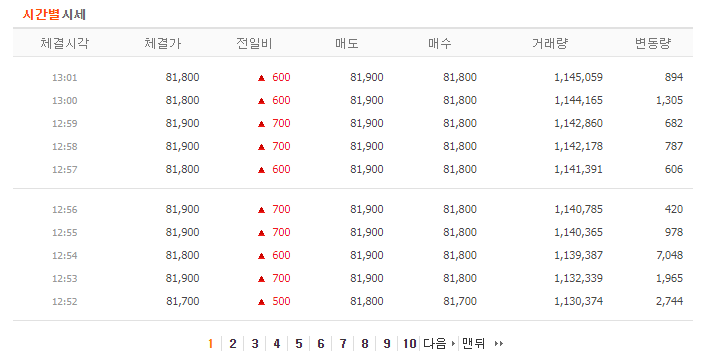

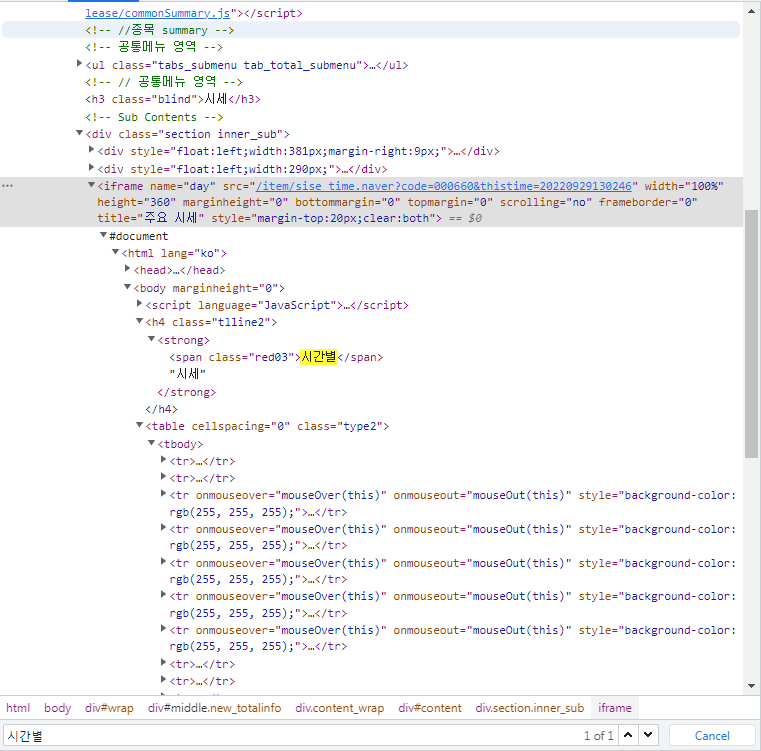

In [22]:
# 1) stock_url이라는 변수에 Sk하이닉스 시간별 시세의 scr를 URL 저장
# [1] 네이버 금융 홈페이지 접속 : https://finance.naver.com/
# [4] 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '시간별' 검색 > scr 값 복사 : /item/sise_time.naver?code=000660&thistime=20220929130246
# [1]과 [4] 링크 합쳐서 URL로 저장
stock_url = "https://finance.naver.com//item/sise_time.naver?code=000660&thistime=20220929130246"

## **3. BeautifulSoup 문제 (3)**

* BeautifulSoup User-agent 설정
- user-agent 확인 사이트 : http://www.useragentstring.com/



In [23]:
# 1) header에 user-agent 값 저장
# user-agent란, 웹 크롤링을 진행하면 종종 페이지에서 아무것도 받아오지 못하는 경우 발생! 이유는 대부분 서버에서 봇을 차단하기 때문
# 그래서 user-agent를 headers에 저장하면 오류를 해결할 수 있음
headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}

## **4. BeautifulSoup 문제 (4)**

* BeautifulSoup 첫 번째 단계. Request

In [24]:
# 1) requests 불러오기
# 웹 페이지의 URL을 이용해서 HTML 문서를 요청하기 위해 필요한 라이브러리
import requests

In [25]:
# 2) stock_url, headers 정보를 이용하여 HTML 문서를 요청
# requests.get(stock_url, headers = headers)
# - URL 값을 파라미터 값으로 입력
# - 해당 사이트는 반드시 헤더 정보를 요구하기 때문에 파라미터 값으로 헤더 입력
requests.get(stock_url, headers = headers)

<Response [200]>

## **5. BeautifulSoup 문제 (5)**

* BeautifulSoup 두 번째 단계. Response

In [26]:
# 1) 요청한 HTML 문서를 회신하여 response 변수에 저장
# response = requests.get(stock_url, headers = headers)
# - 서버에서 요청을 받아 처리한 후, 요청자에게 응답 줌
# - HTML 코드 형태
response = requests.get(stock_url, headers = headers)

## **6. BeautifulSoup 문제 (6)**

* BeautifulSoup 세 번째 단계. Parsing

In [27]:
# 1) soup 변수에 BeautifulSoup의 객체 생성하고 HTML 코드를 파이썬에서 읽을 수 있도록 파싱
# 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)
# soup = BeautifulSoup(response.text, 'html.parser')
# - html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
# - Response.text에 저장한 html 소스코드를 .parser를 붙여 변환
# - parser는 파이썬의 내장 메소드
soup = BeautifulSoup(response.text, 'html.parser')

## **7. BeautifulSoup 문제 (7)**

* BeautifulSoup 데이터를 텍스트로 반환

In [28]:
# 1) soup 변수에서 'tr' 태그 조건에 해당하는 모든 정보를 검색하여 parsing_list변수에 저장
# find_all : 특정 조건에 해당하는 모든 정보 검색
parsing_list = soup.find_all("tr")

## **8. BeautifulSoup 문제 (8)**

* BeautifulSoup 데이터 출력을 위한 for문

In [29]:
# 1) 수업 복습으로 for문 한 줄씩 읽으면서 이해하기

# None 값은 걸러주기 위한 변수 생성
isCheckNone = None

# 페이지당 일별 종가 출력하기 위한 반복문 <들여쓰기 주의>
for i in range(1, len(parsing_list)):
  # None 값은 걸러주기 위한 조건문 <들여쓰기 주의>
  # .span()는 매치된 문자열의 (시작, 끝)에 해당하는 튜플을 돌려주는 함수
  if(parsing_list[i].span != isCheckNone):
    # parsing_list[i] : i번째 parsing_list, i 번째 "tr" 태그 값
    # .find_all("td", align="center")[0].text : "td" 태그의 align가 "center"인 값들 중 0번째 값
    # .find_all("td", class_="num")[0].text : "td" 태그의 class가 "num"인 값들 중 0번째 값
    print(parsing_list[i].find_all("td", align="center")[0].text,
          parsing_list[i].find_all("td", class_="num")[0].text)